In [1]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import scipy as sp
import numpy as np
import os 

In [2]:
#load audio files
singing_file = "mix_ukulele_singing.wav"
fingerpicking_file = "ukulele_fingerpicking.wav"


In [3]:
ipd.Audio(singing_file)


In [4]:
ipd.Audio(fingerpicking_file)

In [5]:
singing, singing_fs = librosa.load(singing_file)
fingerpicking, fingerpicking_fs = librosa.load(fingerpicking_file)

In [72]:
print(singing.shape)

(930763,)


In [6]:
#duration of 1 sample
sample_duration = 1/singing_fs

print(f"Duration of 1 sample is: {sample_duration:.6f} seconds")

Duration of 1 sample is: 0.000045 seconds


In [7]:
#duration of audio signal in seconds
duration = singing.size * sample_duration

print(f"duration of audio signal is : {duration} seconds")

duration of audio signal is : 42.21147392290249 seconds


(-1.0, 1.0)

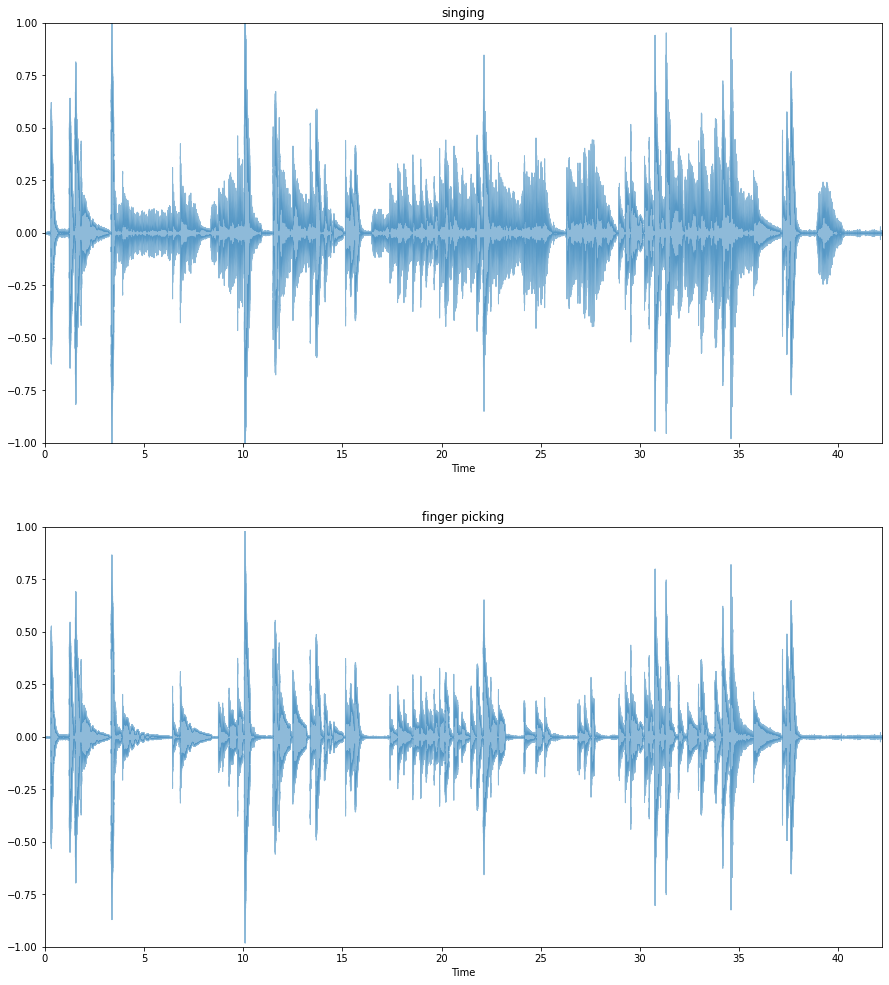

In [8]:
#visualize the waveforms
plt.figure(figsize= (15, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(singing, alpha = 0.5)
plt.title("singing")
plt.ylim((-1,1))

plt.subplot(2, 1, 2)
librosa.display.waveplot(fingerpicking, alpha = 0.5)
plt.title("finger picking")
plt.ylim((-1,1))

# Amplitude envelope

In [9]:
def amplitude_envelope(signal, frame_size): #non overlapping frames
    amplitude_envelope = []
    for i in range(0, len(signal), frame_size):
        current_frame_amplitude_envelope = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_frame_amplitude_envelope)
        
    return np.array(amplitude_envelope)
        
#In the case of Overlapping Frames, Define a new parameter which is the hop size
# example : frame_size = 1024, hop_length = 512 means that the second frame starts halfway through first frame

def amplitude_envelope_overlapping(signal, frame_size, hop_length):
    amplitude_envelope = []
    for i in range(0, len(signal), hop_length):
        current_frame_amplitude_envelope = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_frame_amplitude_envelope)
        
    return np.array(amplitude_envelope)

In [10]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [11]:
ae_singing = amplitude_envelope(singing, FRAME_SIZE)
ae_fingerpicking = amplitude_envelope(fingerpicking, FRAME_SIZE)

In [12]:
ae_singing[0:10]

array([0.00345799, 0.00468611, 0.00460049, 0.0085563 , 0.00781022,
       0.43881828, 0.59323376, 0.42597646, 0.27056086, 0.17288883],
      dtype=float32)

In [13]:
ae_fingerpicking[0:10]

array([0.00301708, 0.00480995, 0.00412105, 0.00241198, 0.00402648,
       0.37573382, 0.5091985 , 0.36514276, 0.23360392, 0.15026313],
      dtype=float32)

In [14]:
ae_singing_overlapping = amplitude_envelope_overlapping(singing,
                                                        FRAME_SIZE,
                                                       HOP_LENGTH)
ae_fingerpicking_overlapping = amplitude_envelope_overlapping(fingerpicking,
                                                        FRAME_SIZE,
                                                       HOP_LENGTH)

In [15]:
ae_singing_overlapping

array([0.00345799, 0.00432239, 0.00468611, ..., 0.01233006, 0.01233006,
       0.00521079], dtype=float32)

In [16]:
ae_fingerpicking_overlapping

array([0.00301708, 0.00316503, 0.00480995, ..., 0.00889473, 0.00889473,
       0.00471844], dtype=float32)

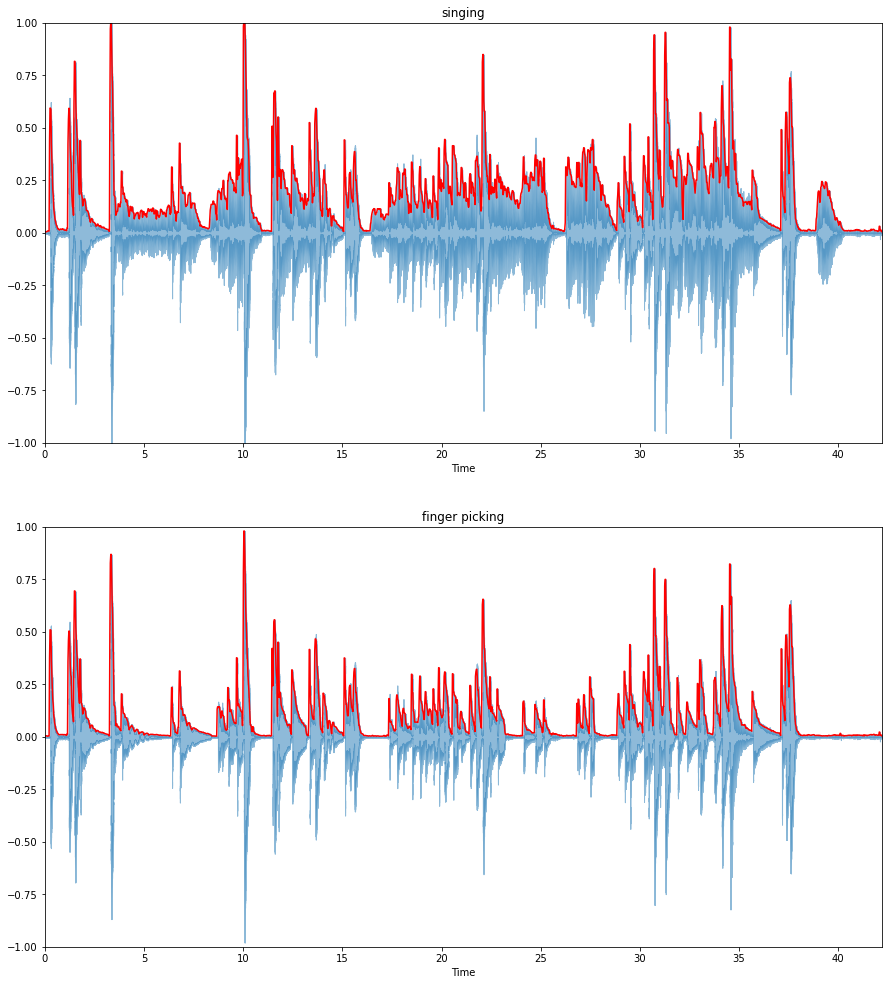

In [17]:
#visualise amplitude envelopes for all the audio files

frames = range(0, ae_fingerpicking_overlapping.size)
t = librosa.frames_to_time(frames, hop_length= HOP_LENGTH)

plt.figure(figsize= (15, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(singing, alpha = 0.5)
plt.plot(t,ae_singing_overlapping, color = 'r')
plt.title("singing")
plt.ylim((-1,1))

plt.subplot(2, 1, 2)
librosa.display.waveplot(fingerpicking, alpha = 0.5)
plt.plot(t,ae_fingerpicking_overlapping, color = 'r')
plt.title("finger picking")
plt.ylim((-1,1))

plt.show()

# Root Mean Squared Energy 

In [18]:
FRAME_LENGTH = 1024
HOP_LENGTH = 512

rms_singing = librosa.feature.rms(singing,frame_length= FRAME_LENGTH,
                                 hop_length=HOP_LENGTH)[0]
rms_fingerpicking = librosa.feature.rms(fingerpicking,frame_length= FRAME_LENGTH,
                                 hop_length=HOP_LENGTH)[0]
print(f"The root mean squared Energy of singing is {rms_singing}")
print(f"The root mean squared Energy of fingerpicking is {rms_fingerpicking}")

The root mean squared Energy of singing is [0.00206501 0.00192228 0.00171151 ... 0.00455243 0.00435879 0.00396288]
The root mean squared Energy of fingerpicking is [0.00178246 0.00165334 0.00137966 ... 0.00308167 0.00292812 0.00289371]


In [77]:
singing.shape

(930763,)

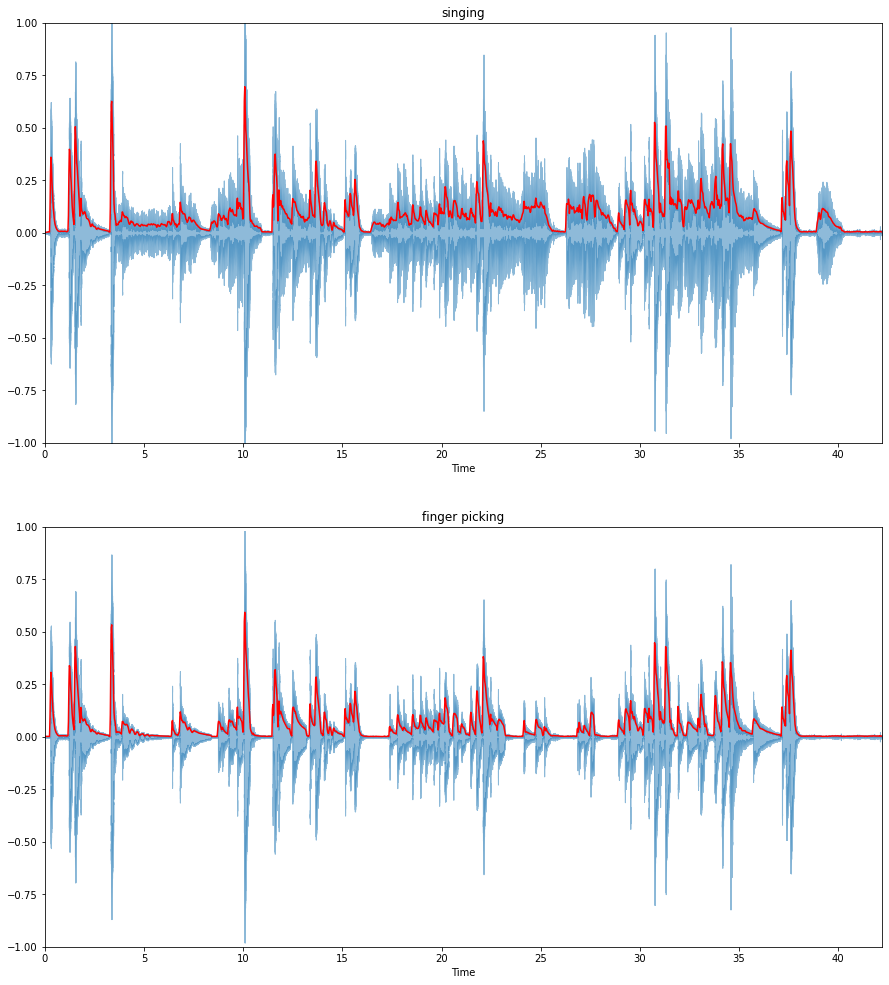

In [19]:
# plot the rmse for all the music pieces

frames = range(0, rms_fingerpicking.size)
t = librosa.frames_to_time(frames, hop_length= HOP_LENGTH)

plt.figure(figsize= (15, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(singing, alpha = 0.5)
plt.plot(t,rms_singing, color = 'r')
plt.title("singing")
plt.ylim((-1,1))

plt.subplot(2, 1, 2)
librosa.display.waveplot(fingerpicking, alpha = 0.5)
plt.plot(t,rms_fingerpicking, color = 'r')
plt.title("finger picking")
plt.ylim((-1,1))

plt.show()

# Zero crossing rate 

In [20]:
# note: zero crossing rate is usually higher in noise
zrc_singing = librosa.feature.zero_crossing_rate(singing, frame_length= FRAME_LENGTH, hop_length=HOP_LENGTH)[0]
zrc_fingerpicking = librosa.feature.zero_crossing_rate(fingerpicking,frame_length= FRAME_LENGTH, hop_length=HOP_LENGTH)[0]

In [21]:
zrc_singing

array([0.00683594, 0.01953125, 0.02148438, ..., 0.01367188, 0.02050781,
       0.02636719])

In [22]:
zrc_fingerpicking

array([0.00683594, 0.02148438, 0.02148438, ..., 0.02246094, 0.01953125,
       0.02734375])

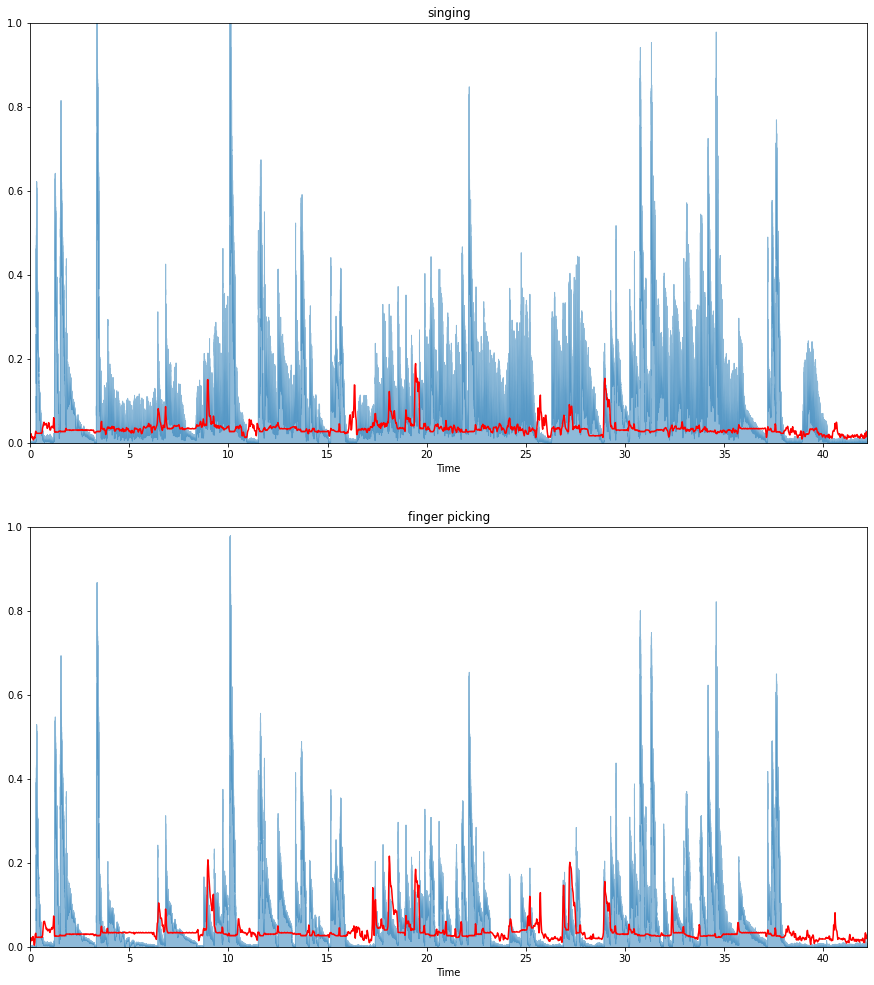

In [23]:
# plot the zero crossing rate for all the music pieces

frames = range(0, rms_fingerpicking.size)
t = librosa.frames_to_time(frames, hop_length= HOP_LENGTH)

plt.figure(figsize= (15, 17))

plt.subplot(2, 1, 1)
librosa.display.waveplot(singing, alpha = 0.5)
plt.plot(t,zrc_singing, color = 'r')
plt.title("singing")
plt.ylim((0,1))

plt.subplot(2, 1, 2)
librosa.display.waveplot(fingerpicking, alpha = 0.5)
plt.plot(t,zrc_fingerpicking, color = 'r')
plt.title("finger picking")
plt.ylim((0,1))

plt.show()

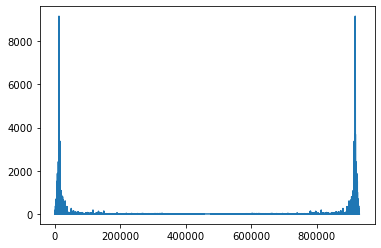

In [74]:
ft = np.fft.fft(singing)
magnitude_spectrum = np.abs(ft)
plt.plot(magnitude_spectrum)

# Spectrum using fourier transform for singing file

In [24]:
def plot_magnitude_spectrum(signal, title, sr, f_ratio=1):
    
    ft = np.fft.fft(signal)
    magnitude_spectrum = np.abs(ft)
    
    plt.figure(figsize=(20,10))
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    num_frequency_bins = int(len(frequency)*f_ratio)
    plt.plot(frequency[:num_frequency_bins],magnitude_spectrum[:num_frequency_bins])
    plt.title(title)
    plt.xlabel("Frequency (Hz)")

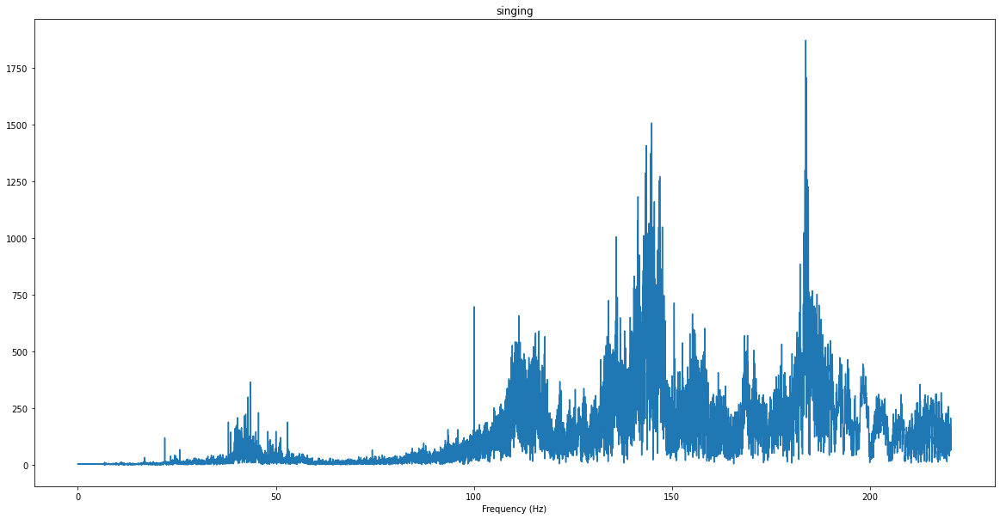

In [25]:
plot_magnitude_spectrum(singing, "singing", singing_fs, 0.01)


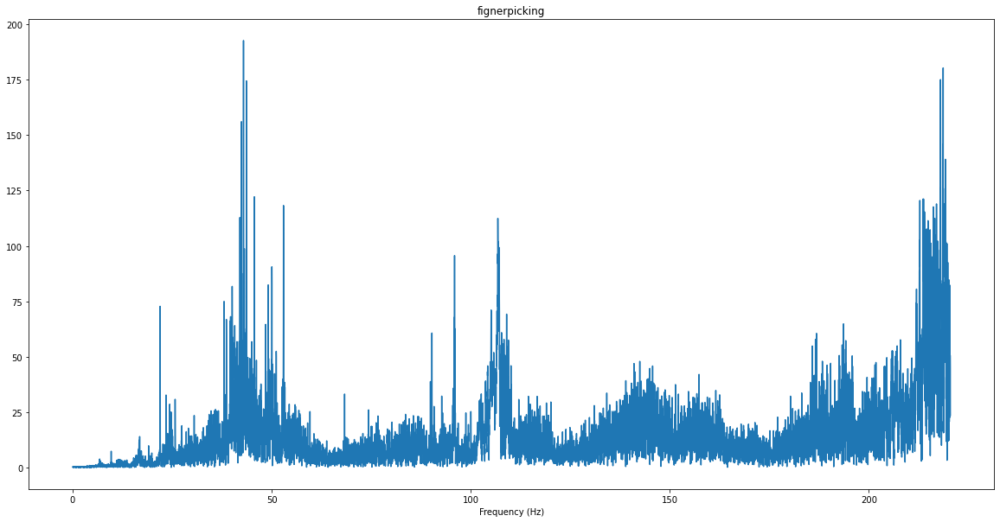

In [26]:
plot_magnitude_spectrum(fingerpicking, "fignerpicking",
                        fingerpicking_fs, 0.01)

# Extracting short-time fourier transform

In [27]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [28]:
s_singing = librosa.stft(singing, n_fft = FRAME_SIZE, hop_length=HOP_SIZE)
s_fingerpicking = librosa.stft(fingerpicking, n_fft = FRAME_SIZE, hop_length=HOP_SIZE)

In [29]:
s_singing.shape
# (frame_size/2 + 1, (samples - frame_size)/hop_size + 1)

(1025, 1818)

In [30]:
type(s_singing[0][0])

numpy.complex64

# Caclulating the spectrogram

In [31]:
Y_singing = np.abs(s_singing) ** 2
Y_fingerpicking = np.abs(s_fingerpicking) **2

In [32]:
Y_singing.shape

(1025, 1818)

In [33]:
type(Y_singing[0][0])

numpy.float32

# Visualizing the spectrogram

In [34]:
def plot_spectrogram(Y, sr, hop_length, y_axis = "linear"):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y,
                            sr=sr,
                            hop_length = hop_length,
                            x_axis = "time",
                            y_axis = y_axis)
    plt.colorbar(format = "%+2.f")
    plt.show()

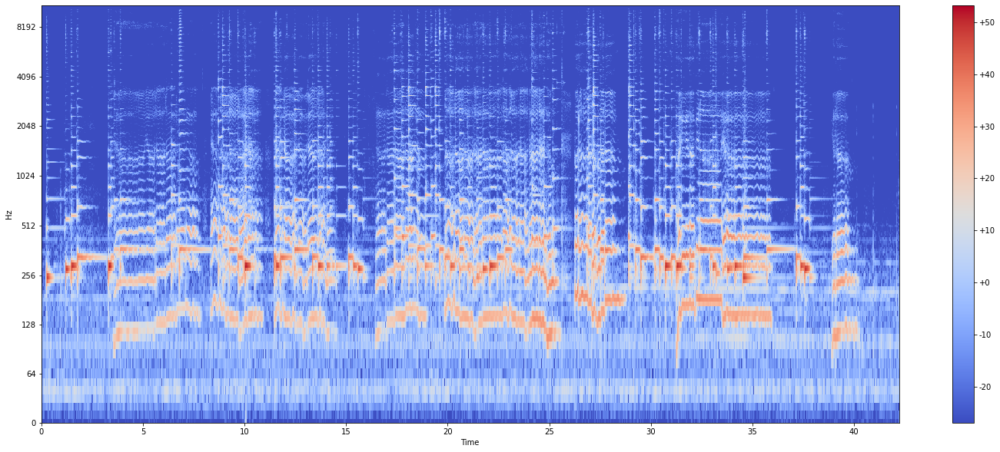

In [35]:
Y_log_scale = librosa.power_to_db(Y_singing)
plot_spectrogram(Y_log_scale, singing_fs, HOP_SIZE, "log")

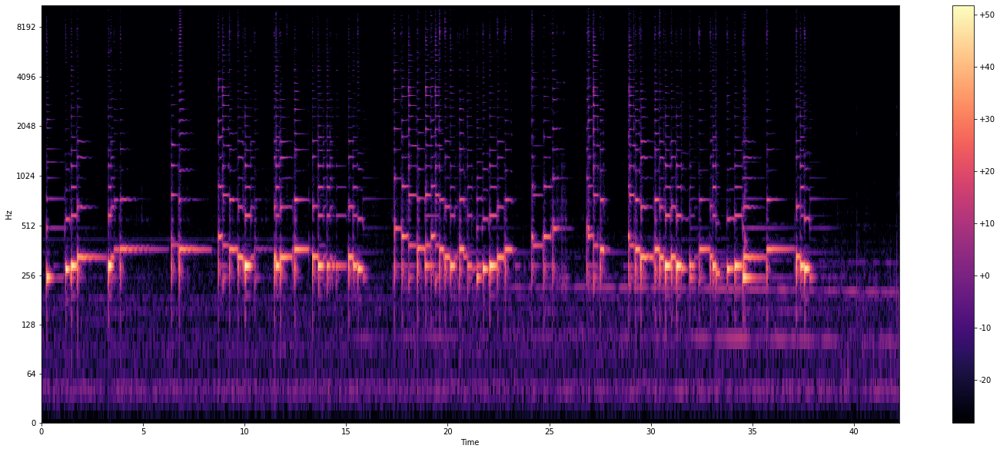

In [36]:
Y_log_scale1 = librosa.power_to_db(Y_fingerpicking)
plot_spectrogram(Y_log_scale1, fingerpicking_fs, HOP_SIZE, "log")

In [37]:
Y_log_scale.shape

(1025, 1818)

In [38]:
# mel filter banks shape ((# bands, framesize/2 +1)) 
Y_singing.shape  # (frame_size/2 +1, # frames)

(1025, 1818)

Mel spectrogram = M.Y  . shape ( #bands, #frames)


# Mel Filter Banks

In [39]:
filter_banks = librosa.filters.mel(n_fft = 2048, sr = 22050, n_mels = 10  )

In [40]:
filter_banks.shape

(10, 1025)

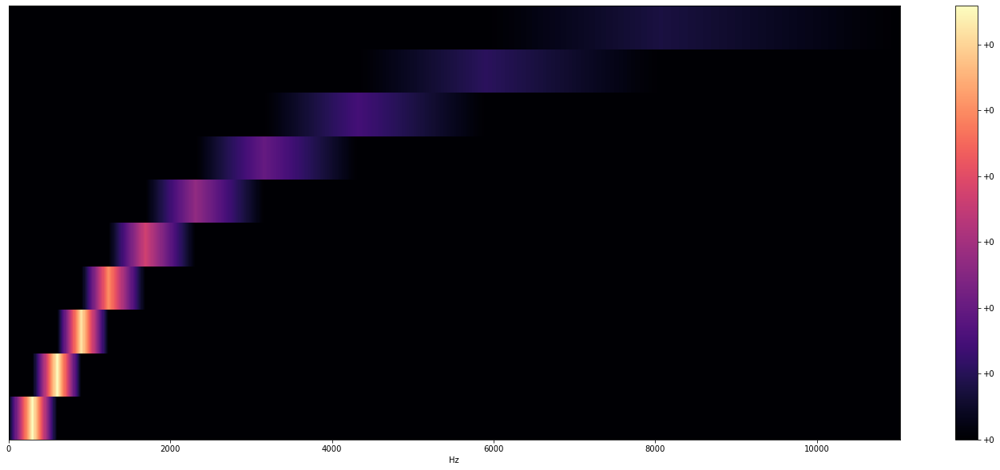

In [41]:
# viusualise filter banks

plt.figure(figsize= (25,10))
librosa.display.specshow(filter_banks, sr = singing_fs, x_axis = 'linear' )
plt.colorbar(format = "%+2.f")
plt.show()

# Extracting Mel spectrogram

In [42]:
mel_spectrogram = librosa.feature.melspectrogram(singing,
                                                sr = singing_fs,
                                                n_fft = 2048,
                                                hop_length= HOP_SIZE,
                                                n_mels = 10)

In [43]:
mel_spectrogram.shape

(10, 1818)

In [44]:
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

In [45]:
type(singing_fs)

int

In [46]:
def plot_mel_spectrogram(Y,sr, y_axis = "linear"):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y,
                            sr=sr,
                            x_axis = "time",
                            y_axis = y_axis)
    plt.colorbar(format = "%+2.f")
    plt.show()

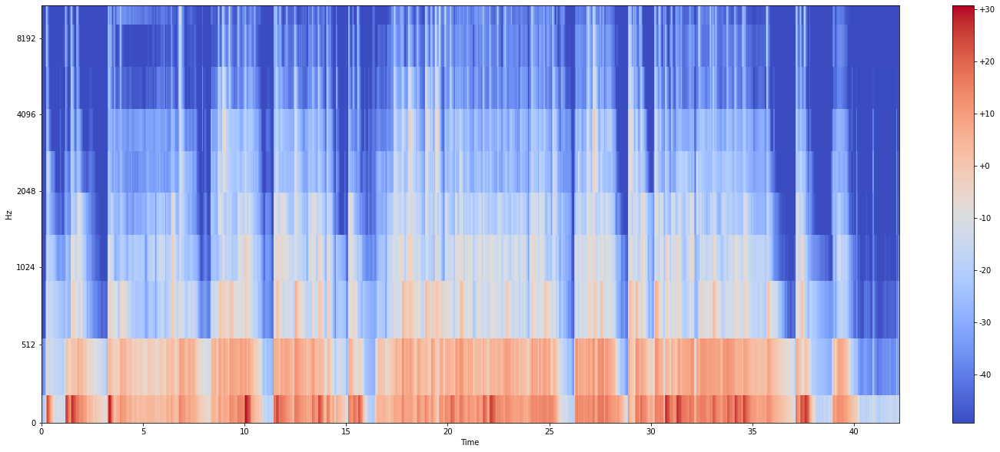

In [47]:
plot_mel_spectrogram(log_mel_spectrogram, singing_fs, "mel")

# Extracting MFCC's

In [48]:
 mfccs = librosa.feature.mfcc(singing, n_mfcc = 13, sr = singing_fs  )

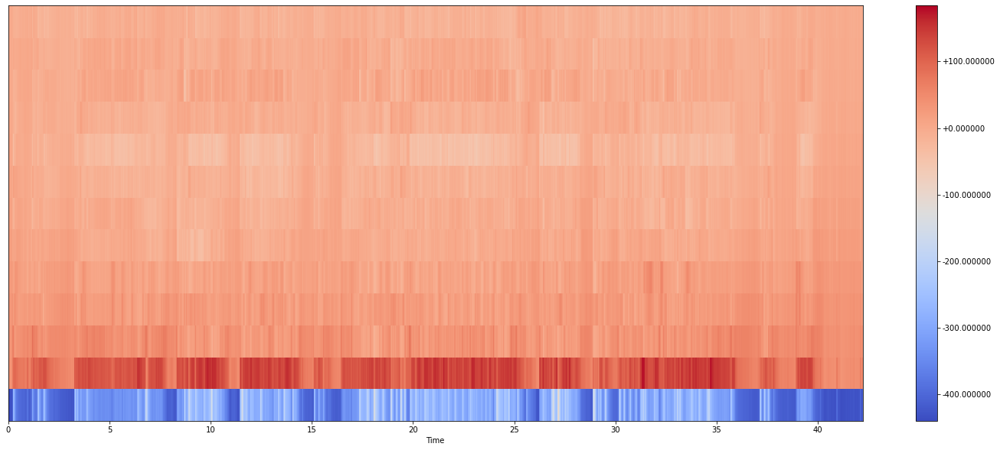

In [50]:
#Visualize MFCCs


plt.figure(figsize=(25,10))
librosa.display.specshow(mfccs, x_axis= "time", sr = singing_fs)
plt.colorbar(format="%+2f")
plt.show()

In [51]:
# Calculate delta and delta 2 MFCCS

delta_mfccs = librosa.feature.delta(mfccs)
delta2_mfccs = librosa.feature.delta (mfccs, order = 2)

In [52]:
delta_mfccs.shape

(13, 1818)

In [53]:
delta2_mfccs.shape

(13, 1818)

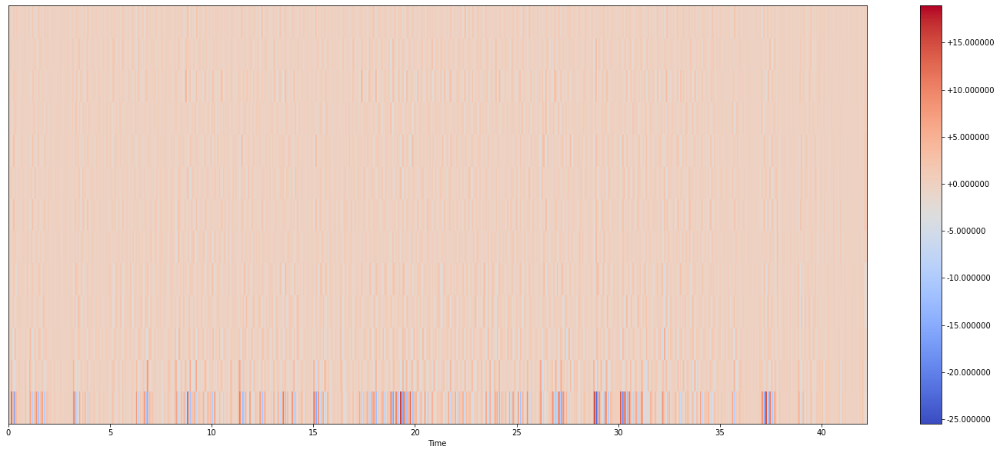

In [54]:
#visualize delta 

plt.figure(figsize=(25,10))
librosa.display.specshow(delta2_mfccs, x_axis= "time", sr = singing_fs)
plt.colorbar(format="%+2f")
plt.show()

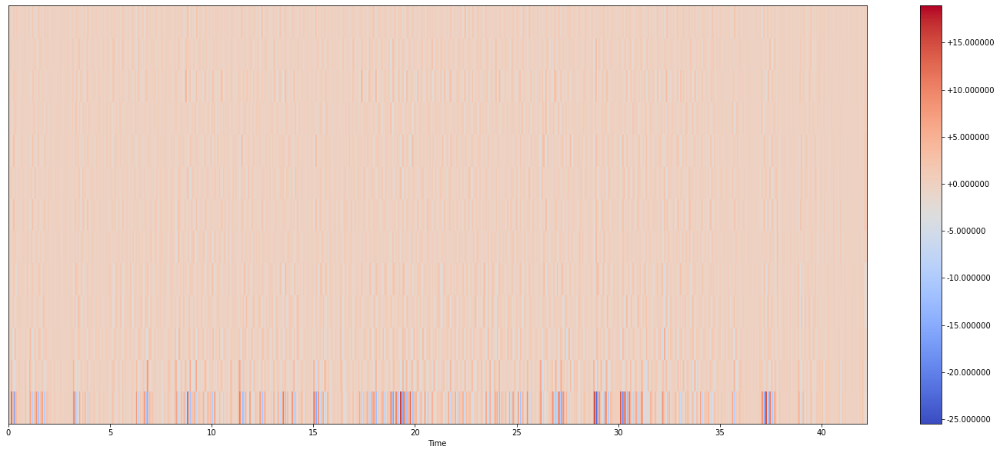

In [55]:
# visualize delta2

plt.figure(figsize=(25,10))
librosa.display.specshow(delta2_mfccs, x_axis= "time", sr = singing_fs)
plt.colorbar(format="%+2f")
plt.show()

In [56]:
comprehensive_mfccs = np.concatenate((mfccs, delta_mfccs, delta2_mfccs))

In [57]:
comprehensive_mfccs.shape

(39, 1818)

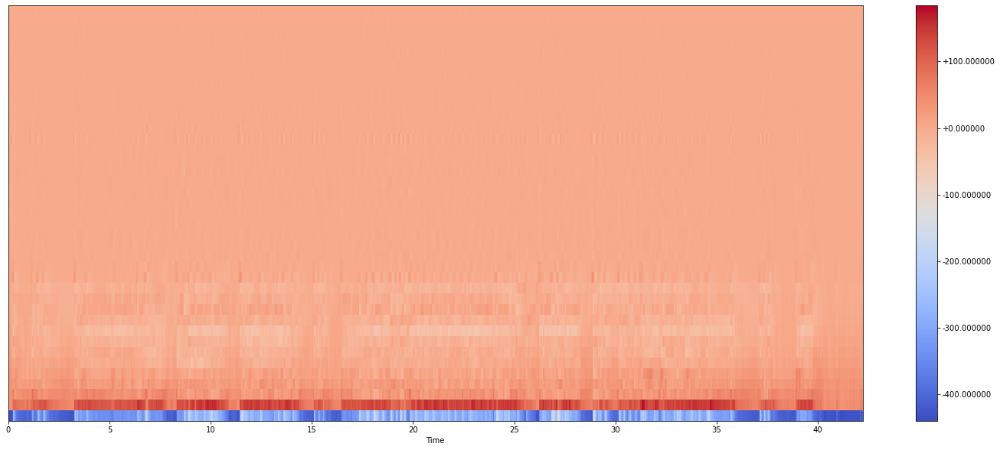

In [58]:
# visualize comperehensive MFCCS

plt.figure(figsize=(25,10))
librosa.display.specshow(comprehensive_mfccs, x_axis= "time", sr = singing_fs)
plt.colorbar(format="%+2f")
plt.show()

In [59]:
FRAME_SIZE = 2048
HOP_SIZE = 512

singing_spec = librosa.stft(singing, n_fft = FRAME_SIZE, hop_length = HOP_SIZE)
fingerpicking_spec = librosa.stft(fingerpicking, n_fft = FRAME_SIZE, hop_length = HOP_SIZE)


# Calculate Band Energy Ratio

In [60]:
def calculate_split_frequency_bin ( spectrogram, 
                                   split_frequency, sample_rate):
    frequency_range = sample_rate/2
    frequency_delta_per_bin = frequency_range / spectrogram.shape[0]  
    split_frequency_bin = np.floor(split_frequency/frequency_delta_per_bin)
    return int(split_frequency_bin)
    

In [61]:
split_frequency_bin = calculate_split_frequency_bin(singing_spec, 2000, 22050)
split_frequency_bin

185

In [62]:
def calculate_band_enegy_ratio(spectrogram, split_frequency, sample_rate):
    split_frequency_bin = calculate_split_frequency_bin(spectrogram,
                                                        split_frequency,
                                                       sample_rate)
    #move to power spectrogram
    power_spect = np.abs(spectrogram)**2
    power_spect = power_spect.T
    
    band_energy_ratio = []
    for frequencies_in_frame in power_spect:
        sum_power_low_frequencies = np.sum(frequencies_in_frame[:split_frequency_bin])
        sum_power_high_frequencies = np.sum(frequencies_in_frame[split_frequency_bin:])
        ber_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(ber_current_frame)
        
    return np.array(band_energy_ratio)
        

In [63]:
ber_singing = calculate_band_enegy_ratio(singing_spec, 2000, singing_fs)
ber_fingerpicking = calculate_band_enegy_ratio(fingerpicking_spec, 2000, fingerpicking_fs)

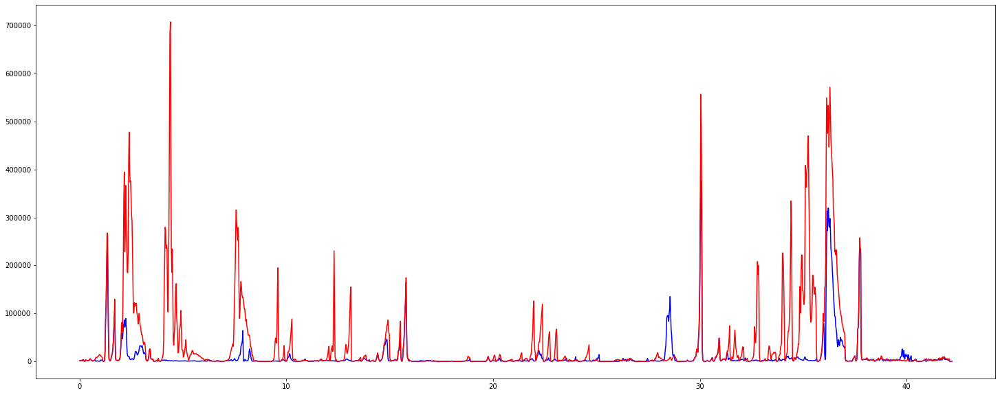

In [64]:
#Visualise band Energy Ratio curves
plt.figure(figsize = (25,10))
frames = range(len(ber_singing))
t = librosa.frames_to_time(frames, sr = singing_fs, hop_length= HOP_SIZE )

plt.plot(t, ber_singing, color = "b")
plt.plot(t, ber_fingerpicking, color = "r")
plt.show()

# Spectral centroid 

In [65]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [66]:
sc_singing = librosa.feature.spectral_centroid(y=singing,
                                               sr=singing_fs,
                                              n_fft= FRAME_SIZE,
                                              hop_length=HOP_SIZE)[0]

In [67]:
sc_fingerpicking = librosa.feature.spectral_centroid(y=fingerpicking,
                                               sr=fingerpicking_fs,
                                              n_fft= FRAME_SIZE,
                                              hop_length=HOP_SIZE)[0]

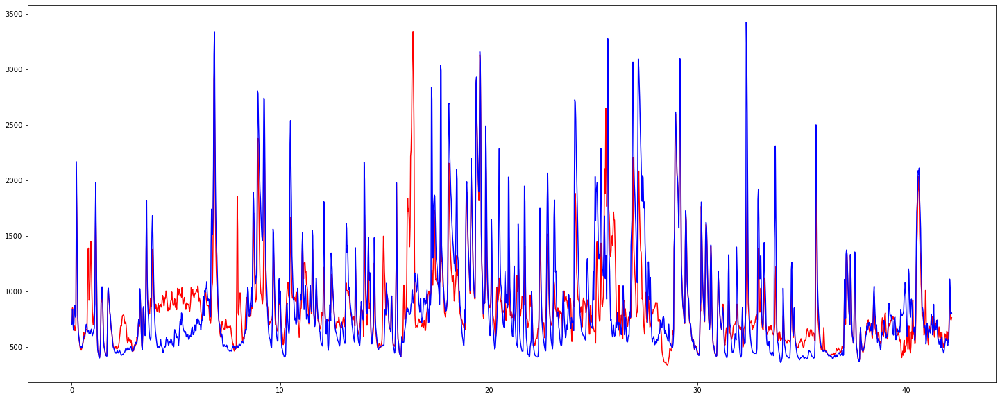

In [68]:
# Visualise spectral centroid

plt.figure(figsize = (25,10))
frames = range(len(sc_singing))
t = librosa.frames_to_time(frames)

plt.plot(t, sc_singing, color = "r")
plt.plot(t, sc_fingerpicking, color = "b")
plt.show()

# Spectral Bandwidth

In [69]:
sb_singing = librosa.feature.spectral_bandwidth(y=singing,
                                               sr = singing_fs,
                                               n_fft= FRAME_SIZE,
                                               hop_length=HOP_SIZE)[0]

In [70]:
sb_fingerpicking = librosa.feature.spectral_bandwidth(y=fingerpicking,
                                               sr = fingerpicking_fs,
                                               n_fft= FRAME_SIZE,
                                               hop_length=HOP_SIZE)[0]

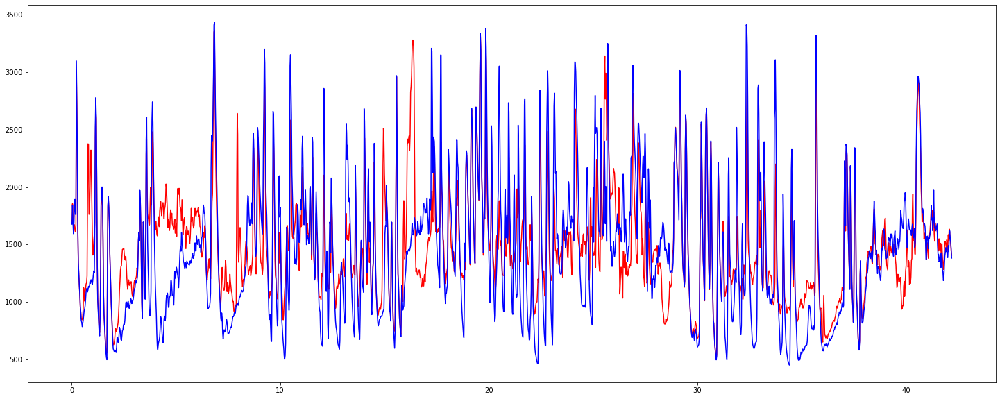

In [71]:
# Visualise bandwidth

plt.figure(figsize = (25,10))
frames = range(len(sc_singing))
t = librosa.frames_to_time(frames)

plt.plot(t, sb_singing, color = "r")
plt.plot(t, sb_fingerpicking, color = "b")
plt.show()